In [1]:
import os
import torch
import os
import matplotlib.pyplot as plt
import cv2
import scipy
import numpy as np
from PIL import Image

In [2]:
from IPython import display
display.clear_output()

In [3]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.7/40.7 kB 701.2 kB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.9/756.9 kB 6.3 MB/s eta 0:00:0000:0100:01


In [4]:
DATA_DIR = '/kaggle/input/posm-dataset-image/POSM_materials_dataset.v3i.yolov8/' #directory with data.yaml configuration file

In [79]:
with open(f'{DATA_DIR}data.yaml', 'r') as f:
    print(f.read())

train: ./train/images
val: ./valid/images
test: ./test/images

nc: 3
names: ['Megafon', 'Opponents', 'Yota']

roboflow:
  workspace: d2j3dspace1
  project: posm_materials_dataset
  version: 3
  license: CC BY 4.0
  url: https://universe.roboflow.com/d2j3dspace1/posm_materials_dataset/dataset/3



In [6]:
from ultralytics import YOLO
from ultralytics.utils.plotting import Annotator, colors

In [7]:
# Load a model
model = YOLO('yolov8x.pt', task='detect')


100%|██████████| 131M/131M [00:00<00:00, 290MB/s]  


In [8]:
results = model.train(data=f'{DATA_DIR}data.yaml', epochs=100, imgsz=640, verbose=False)

Ultralytics YOLOv8.2.16 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=/kaggle/input/posm-dataset-image/POSM_materials_dataset.v3i.yolov8/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=False, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=

100%|██████████| 755k/755k [00:00<00:00, 13.7MB/s]
2024-05-17 07:43:14,583	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-05-17 07:43:15,964	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 
  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               
  2                  -1  3    436800  ultralytics.nn.modules.block.C2f             [160, 160, 3, True]           
  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              
  4                  -1  6   3281920  ultralytics.nn.modules.block.C2f             [320, 320, 6, True]           
  5                  -1  1   1844480  ultralytics.nn.modules.conv.Conv             [320, 640, 3, 2]              
  6                  -1  6  13117440  ultralytics.nn.modules.block.C2f             [640, 640, 6, True]           
  7                  -1  1   3687680  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 73.3MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/posm-dataset-image/POSM_materials_dataset.v3i.yolov8/train/labels... 1113 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1113/1113 [00:08<00:00, 129.76it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/posm-dataset-image/POSM_materials_dataset.v3i.yolov8/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/posm-dataset-image/POSM_materials_dataset.v3i.yolov8/valid/labels... 106 images, 0 backgrounds, 0 corrupt: 100%|██████████| 106/106 [00:00<00:00, 123.12it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/posm-dataset-image/POSM_materials_dataset.v3i.yolov8/valid is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      14.3G     0.9798      1.917      1.189         55        640: 100%|██████████| 70/70 [01:26<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:05<00:00,  1.46s/it]

                   all        106        430     0.0113     0.0161    0.00227    0.00135



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      14.3G       1.11      1.487      1.303         63        640: 100%|██████████| 70/70 [01:26<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.12it/s]

                   all        106        430     0.0397     0.0272    0.00455    0.00258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      14.3G      1.161      1.461      1.315         43        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]

                   all        106        430      0.244      0.434      0.175      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      13.9G      1.115      1.395      1.294         71        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]

                   all        106        430      0.368      0.365      0.336       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      14.2G      1.098       1.35      1.285         75        640: 100%|██████████| 70/70 [01:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.06it/s]

                   all        106        430      0.414      0.472      0.445      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100        14G      1.027      1.244      1.238         59        640: 100%|██████████| 70/70 [01:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]

                   all        106        430      0.652      0.573      0.552      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      14.2G      1.024      1.256      1.243         67        640: 100%|██████████| 70/70 [01:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.06it/s]

                   all        106        430      0.608      0.603      0.594      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      13.9G      1.008        1.2      1.236         54        640: 100%|██████████| 70/70 [01:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]

                   all        106        430       0.54      0.678      0.598      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      14.2G     0.9549      1.132      1.198         58        640: 100%|██████████| 70/70 [01:30<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]

                   all        106        430      0.626      0.651      0.643      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100        14G     0.9465      1.095      1.197         88        640: 100%|██████████| 70/70 [01:30<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.06it/s]

                   all        106        430      0.674       0.66      0.668      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      14.2G     0.9239       1.06      1.178         33        640: 100%|██████████| 70/70 [01:31<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]

                   all        106        430      0.642      0.707      0.667      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100        14G     0.8983      1.028       1.17         27        640: 100%|██████████| 70/70 [01:30<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]

                   all        106        430       0.72      0.606      0.661      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      14.2G     0.9069      1.043      1.178         63        640: 100%|██████████| 70/70 [01:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.06it/s]

                   all        106        430      0.718      0.654      0.677      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100        14G     0.9097      1.032      1.179         45        640: 100%|██████████| 70/70 [01:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]

                   all        106        430      0.699      0.686      0.691      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      14.2G     0.8778     0.9973      1.154         53        640: 100%|██████████| 70/70 [01:30<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]

                   all        106        430      0.645      0.719      0.669      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      13.9G     0.8997     0.9975      1.168         48        640: 100%|██████████| 70/70 [01:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]

                   all        106        430      0.674        0.7      0.689       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      14.2G     0.8704     0.9696      1.148         72        640: 100%|██████████| 70/70 [01:30<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]

                   all        106        430      0.733      0.672      0.701      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100        14G     0.8618     0.9382      1.144         85        640: 100%|██████████| 70/70 [01:30<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.703      0.688      0.703      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      14.2G      0.836     0.9141      1.132         70        640: 100%|██████████| 70/70 [01:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.07it/s]

                   all        106        430      0.704      0.717      0.711      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      13.9G     0.8281     0.8948      1.117         60        640: 100%|██████████| 70/70 [01:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.635      0.715      0.695      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      14.2G     0.8255     0.9129      1.124         49        640: 100%|██████████| 70/70 [01:30<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]

                   all        106        430      0.707       0.73      0.712      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      13.9G     0.8357     0.9019      1.135         35        640: 100%|██████████| 70/70 [01:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]

                   all        106        430      0.752      0.676      0.706      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      14.2G     0.8141     0.8604      1.111         50        640: 100%|██████████| 70/70 [01:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.06it/s]

                   all        106        430      0.656      0.705      0.692      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      13.9G     0.8078     0.8774      1.117         62        640: 100%|██████████| 70/70 [01:30<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]

                   all        106        430      0.723      0.713      0.705      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      14.2G     0.7836     0.8165      1.096         61        640: 100%|██████████| 70/70 [01:30<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]

                   all        106        430      0.722      0.725       0.71      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      13.9G      0.767     0.7771      1.092         54        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.752      0.729      0.745        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      14.2G     0.7819     0.7965      1.097         52        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.764      0.708      0.755      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      13.9G     0.7808     0.8049      1.089         67        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430       0.72      0.744      0.744      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      14.2G     0.7637      0.766      1.085         69        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.709      0.714      0.716      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100        14G     0.7599     0.7834      1.096         75        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.718      0.705      0.727      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      14.2G     0.7803     0.7845      1.095         56        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.751      0.725      0.742      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      13.9G     0.7611     0.7811      1.091         51        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.751      0.736      0.742      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      14.2G      0.755     0.7619      1.085         57        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.779      0.685      0.747      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      13.9G     0.7518     0.7624      1.085         59        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.711      0.747      0.729      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      14.2G     0.7547     0.7525      1.093         46        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.796      0.713      0.746      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      13.9G     0.7491     0.7337      1.077         47        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.794      0.713      0.765      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      14.2G     0.7233       0.72      1.073         66        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.766      0.724      0.749      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      13.9G     0.7206     0.6904      1.053         73        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.781       0.71      0.738      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      14.2G     0.7248     0.7147      1.065         41        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.768      0.717      0.755      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      13.9G     0.7107     0.6674      1.048         56        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.729      0.722       0.75      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      14.2G     0.7087     0.6565      1.052         39        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430       0.77       0.75       0.77      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      13.9G     0.7019     0.6602      1.046         42        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430       0.75      0.764      0.767       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      14.2G     0.7013     0.6612      1.053         40        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.771      0.729      0.756      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      13.9G     0.7064     0.6767      1.054         57        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.772      0.718      0.757      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      14.2G     0.6982     0.6611      1.049         58        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]

                   all        106        430      0.799      0.697       0.76      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      13.9G     0.6828     0.6556      1.046         42        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.797      0.711      0.765      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      14.2G      0.685     0.6263       1.04         59        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]

                   all        106        430      0.737       0.75      0.766      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      13.9G     0.6763     0.6205      1.045         41        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.819      0.696      0.754      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      14.2G     0.6776      0.598      1.037         39        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.728      0.726      0.746      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      13.9G      0.661     0.5932      1.029         47        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.751      0.713      0.735      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      14.2G     0.6696     0.5919      1.035         75        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.768      0.757      0.776      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      13.9G     0.6531     0.5863      1.022         32        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.812        0.7      0.767      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      14.2G     0.6577     0.5809      1.027         54        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.728      0.744      0.754       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      13.9G     0.6473     0.5665      1.014         54        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.761      0.708      0.745      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      14.2G     0.6555     0.5768       1.02         64        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.767      0.749      0.762      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100        14G     0.6575     0.5644      1.017         40        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.748       0.74      0.765      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      14.2G     0.6336     0.5426      1.011         54        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.744      0.741      0.765      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100        14G     0.6383     0.5386      1.008         62        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]

                   all        106        430      0.725      0.721      0.748      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      14.2G     0.6384     0.5474      1.012         62        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.751      0.747      0.761      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      13.9G      0.629      0.528      1.007         30        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.12it/s]

                   all        106        430      0.748      0.747      0.765      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      14.2G     0.6463     0.5536      1.021         55        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.736      0.763      0.766      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100        14G     0.6242     0.5231      1.009         23        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.782      0.769      0.781      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      14.2G      0.629      0.532      1.012         51        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]

                   all        106        430      0.789       0.74      0.781      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      13.9G     0.6173     0.5039     0.9948         76        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]

                   all        106        430      0.731      0.736      0.747      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      14.2G     0.6073     0.5021     0.9907         50        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.795      0.719      0.758      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      13.9G     0.6117     0.5039     0.9947         63        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.796      0.713      0.762      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      14.2G     0.6002     0.4996     0.9928         80        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]

                   all        106        430      0.837        0.7      0.761      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      13.9G     0.6024     0.4954     0.9929         86        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.782      0.755      0.766      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      14.2G     0.5889     0.4901     0.9802         55        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]

                   all        106        430      0.769      0.755      0.779      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      13.9G     0.5937     0.4657     0.9887         47        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.791      0.735      0.778      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      14.2G     0.5914     0.4705     0.9768         35        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.832      0.726      0.771      0.635



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      13.9G     0.5779     0.4486     0.9834         58        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.821      0.718       0.78      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      14.2G      0.584     0.4531     0.9801         54        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430       0.77      0.755      0.772      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100        14G     0.5788     0.4351     0.9684         76        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.828      0.738       0.78      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      14.2G     0.5612     0.4364     0.9727         76        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.828      0.724      0.767       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      13.9G     0.5647     0.4457     0.9652         35        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.794       0.74      0.772      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      14.2G     0.5727     0.4416      0.971         80        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.804       0.76       0.79      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100        14G     0.5689     0.4413     0.9718         69        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]

                   all        106        430       0.84      0.703      0.774      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      14.2G     0.5641     0.4288     0.9684         34        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.841      0.735      0.782      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100        14G     0.5508     0.4407     0.9708         73        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.809      0.715      0.785      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      14.2G     0.5503     0.4292     0.9672         38        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430       0.82      0.713      0.781      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      13.9G     0.5373      0.403     0.9531         70        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.792      0.746      0.781      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      14.2G     0.5411     0.4028     0.9574         34        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.754      0.734      0.773      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      13.9G     0.5407     0.3994     0.9628         41        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.799      0.719      0.778      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      14.2G     0.5279     0.4081     0.9505         84        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.806      0.724      0.777      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100        14G     0.5219     0.3986     0.9415         32        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.795      0.711      0.773       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      14.2G     0.5221     0.3816     0.9454         61        640: 100%|██████████| 70/70 [01:29<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.807      0.701      0.764      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      13.9G     0.5181     0.3836     0.9447         57        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]

                   all        106        430      0.753      0.732      0.767      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      14.2G      0.517     0.3806     0.9465         69        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.753      0.753      0.769      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      13.9G      0.517     0.3829     0.9534         43        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430       0.84      0.723      0.786      0.649


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      14.2G     0.4874     0.3471     0.9359         42        640: 100%|██████████| 70/70 [01:30<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.802      0.709      0.776      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      13.9G     0.4783     0.3189     0.9341         35        640: 100%|██████████| 70/70 [01:29<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.802      0.724      0.782      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      14.2G     0.4759     0.3218     0.9303         46        640: 100%|██████████| 70/70 [01:28<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.826      0.712      0.777      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      13.9G     0.4711     0.3175     0.9258         57        640: 100%|██████████| 70/70 [01:28<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.822      0.727      0.785      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      14.2G      0.466     0.3062     0.9183         35        640: 100%|██████████| 70/70 [01:28<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430       0.81      0.738      0.779      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      13.9G     0.4638     0.3092     0.9268         46        640: 100%|██████████| 70/70 [01:28<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.836       0.71      0.784      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      14.2G     0.4604     0.3014     0.9194         29        640: 100%|██████████| 70/70 [01:28<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.09it/s]

                   all        106        430      0.831       0.71       0.78      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      13.9G     0.4492     0.2869     0.9144         36        640: 100%|██████████| 70/70 [01:28<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.11it/s]

                   all        106        430      0.831       0.73      0.782      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      14.2G     0.4499     0.2927     0.9138         41        640: 100%|██████████| 70/70 [01:28<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430       0.83      0.722      0.781      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      13.9G     0.4454     0.2836      0.911         37        640: 100%|██████████| 70/70 [01:28<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.10it/s]

                   all        106        430      0.834      0.718      0.781      0.659



100 epochs completed in 2.660 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 136.7MB
Optimizer stripped from runs/detect/train/weights/best.pt, 136.7MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.16 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 68126457 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:06<00:00,  1.53s/it]


                   all        106        430      0.832      0.727      0.782      0.662
Speed: 0.2ms preprocess, 28.9ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▃▆▆▇▇▇▇▇▇███▇██████████████████████████
metrics/mAP50-95(B),▁▂▅▆▆▇▇▇▇▇▇▇▇▇█▇█▇█▇█▇███▇██████████████
metrics/precision(B),▁▃▆▅▆▇▇▇▇▆▇▇▇▇█▇▇▇█▇▇▇▇▇▇▇█▇███████▇████
metrics/recall(B),▁▅▆▇▇▇▇▇█▇███████████▇████▇███████▇███▇█
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,▆█▇▇▆▆▅▅▅▅▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁


# Check

# 100 epochs yolov8x

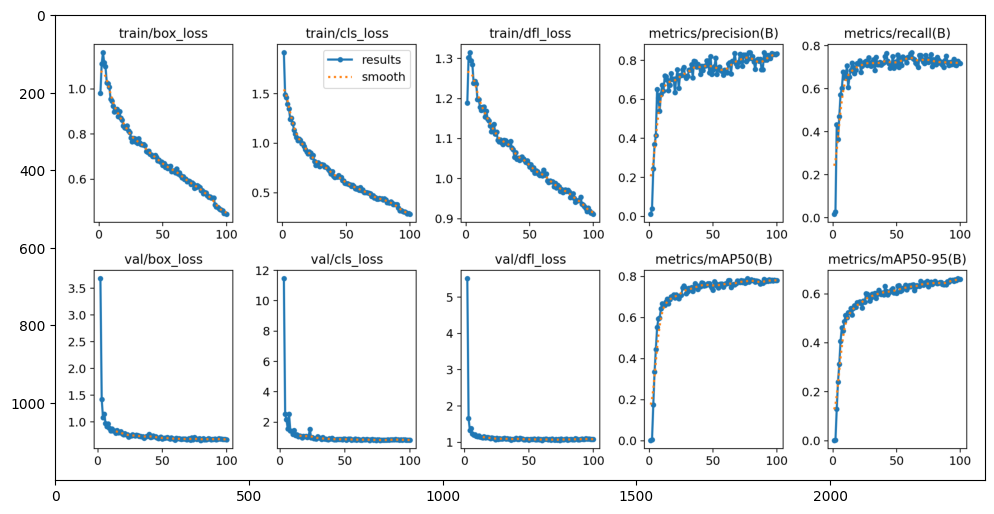

In [24]:
fig, ax = plt.subplots(figsize=(12,10))
ax.imshow(Image.open("/kaggle/working/runs/detect/train/results.png"))

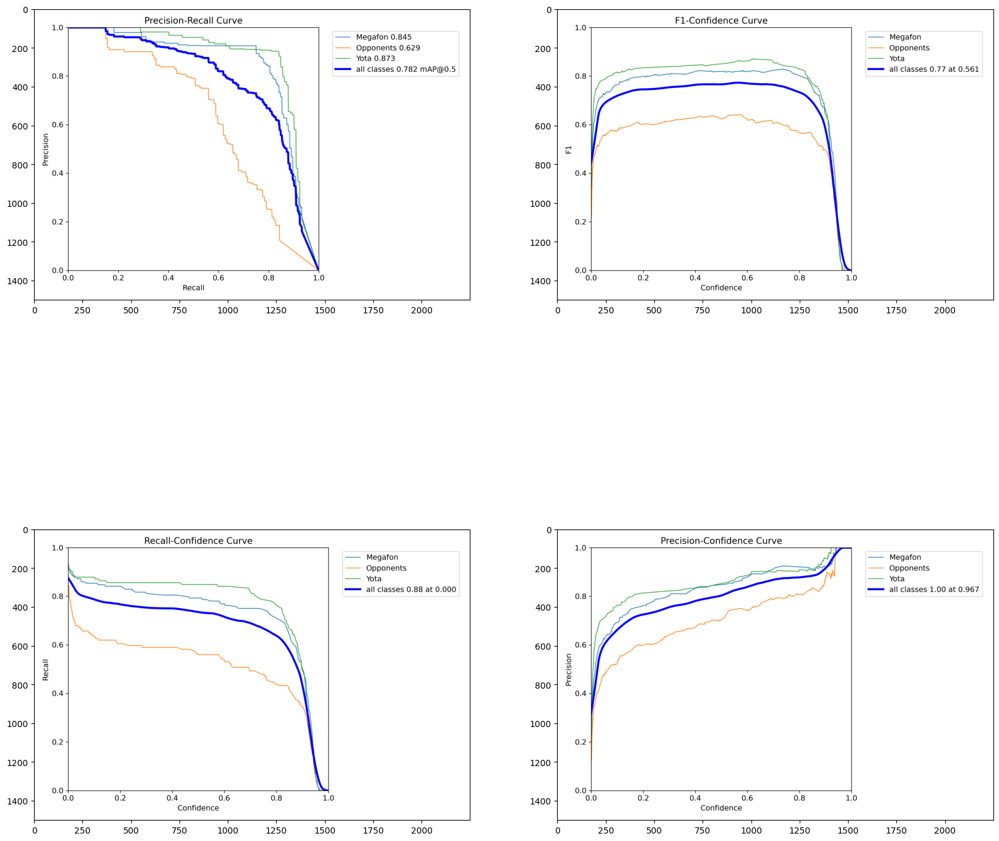

In [16]:
fig, ax = plt.subplots(2, 2, figsize=(20,20))
ax[0][0].imshow(Image.open("/kaggle/working/runs/detect/train/PR_curve.png"))
ax[0][1].imshow(Image.open("/kaggle/working/runs/detect/train/F1_curve.png"))
ax[1][0].imshow(Image.open("/kaggle/working/runs/detect/train/R_curve.png"))
ax[1][1].imshow(Image.open("/kaggle/working/runs/detect/train/P_curve.png"))


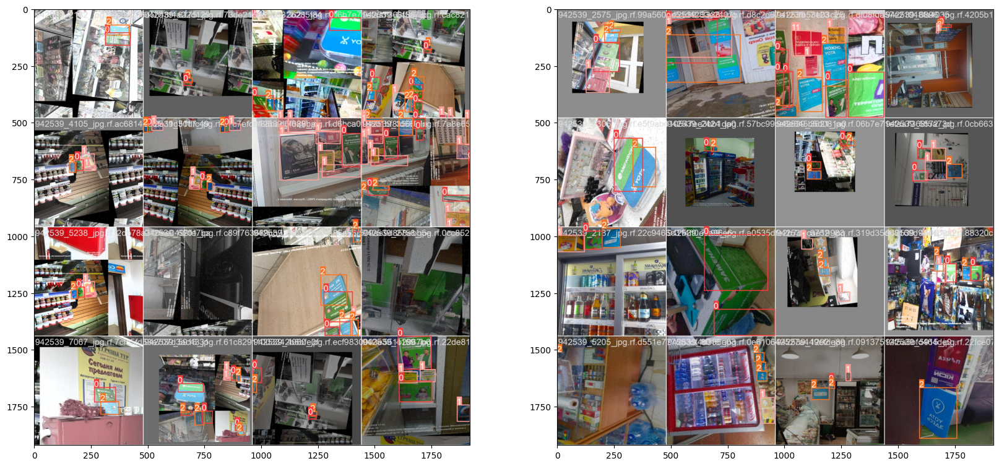

In [11]:
fig, ax = plt.subplots(1,2, figsize=(20,20))
ax[0].imshow(Image.open("/kaggle/working/runs/detect/train/train_batch1.jpg"))
ax[1].imshow(Image.open("/kaggle/working/runs/detect/train/train_batch6302.jpg"))
None

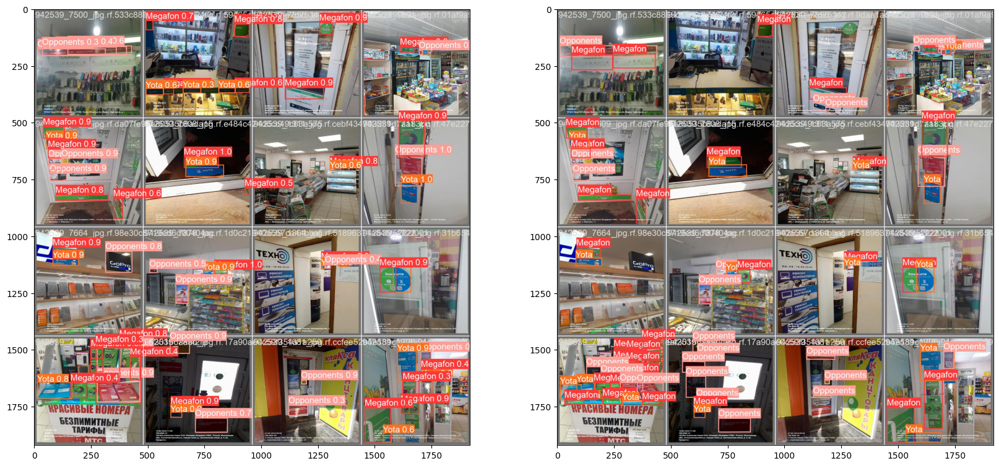

In [12]:
fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].imshow(Image.open("/kaggle/working/runs/detect/train/val_batch0_pred.jpg"))
ax[1].imshow(Image.open("/kaggle/working/runs/detect/train/val_batch0_labels.jpg"))
None

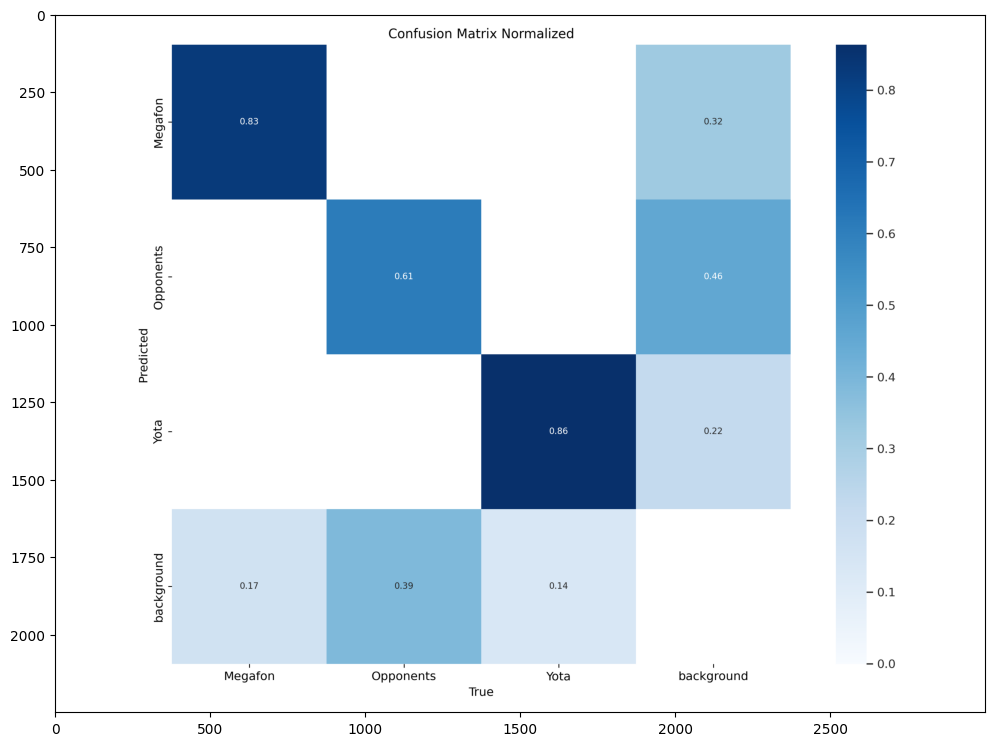

In [13]:
fig, ax = plt.subplots(figsize=(12,10))
plt.imshow(Image.open('/kaggle/working/runs/detect/train/confusion_matrix_normalized.png'))
None

In [14]:
# Export the model
model.export(format='onnx')

Ultralytics YOLOv8.2.16 🚀 Python-3.10.13 torch-2.1.2 CPU (Intel Xeon 2.00GHz)
Model summary (fused): 268 layers, 68126457 parameters, 0 gradients, 257.4 GFLOPs

PyTorch: starting from 'runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 7, 8400) (130.4 MB)

ONNX: starting export with onnx 1.16.0 opset 17...
ONNX: export success ✅ 5.0s, saved as 'runs/detect/train/weights/best.onnx' (260.1 MB)

Export complete (10.7s)
Results saved to /kaggle/working/runs/detect/train/weights
Predict:         yolo predict task=detect model=runs/detect/train/weights/best.onnx imgsz=640  
Validate:        yolo val task=detect model=runs/detect/train/weights/best.onnx imgsz=640 data=/kaggle/input/posm-dataset-image/POSM_materials_dataset.v3i.yolov8/data.yaml  
Visualize:       https://netron.app


'runs/detect/train/weights/best.onnx'

# 50 epochs yolov8x

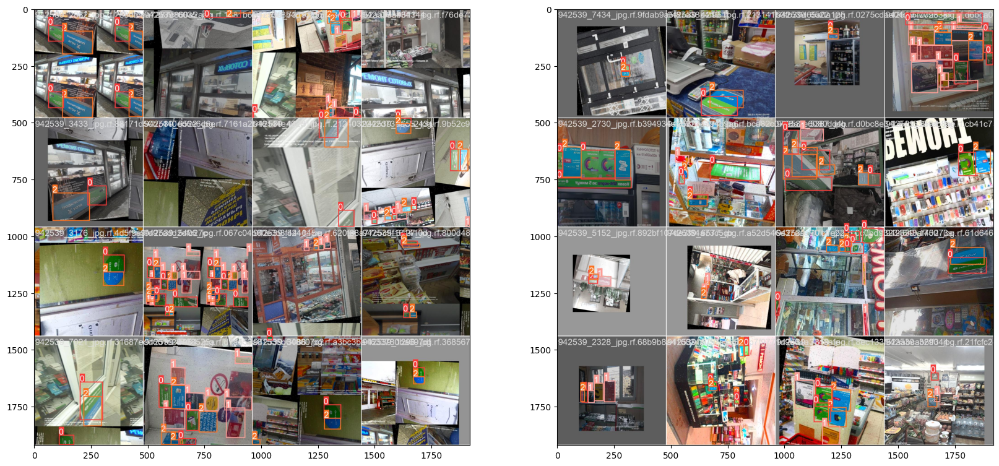

In [61]:
fig, ax = plt.subplots(1,2, figsize=(20,20))
ax[0].imshow(Image.open("/kaggle/working/runs/detect/train/train_batch0.jpg"))
ax[1].imshow(Image.open("/kaggle/working/runs/detect/train/train_batch2871.jpg"))
None

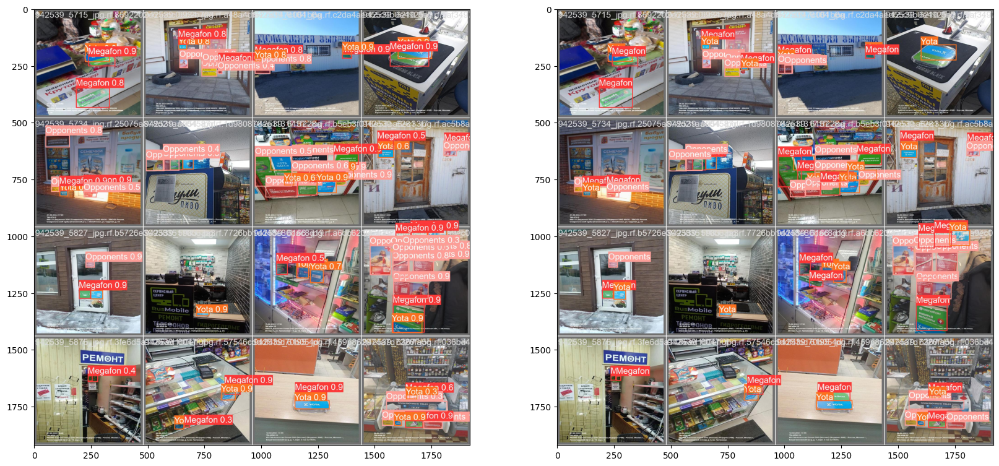

In [62]:
fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].imshow(Image.open("/kaggle/working/runs/detect/train/val_batch2_pred.jpg"))
ax[1].imshow(Image.open("/kaggle/working/runs/detect/train/val_batch2_labels.jpg"))
None

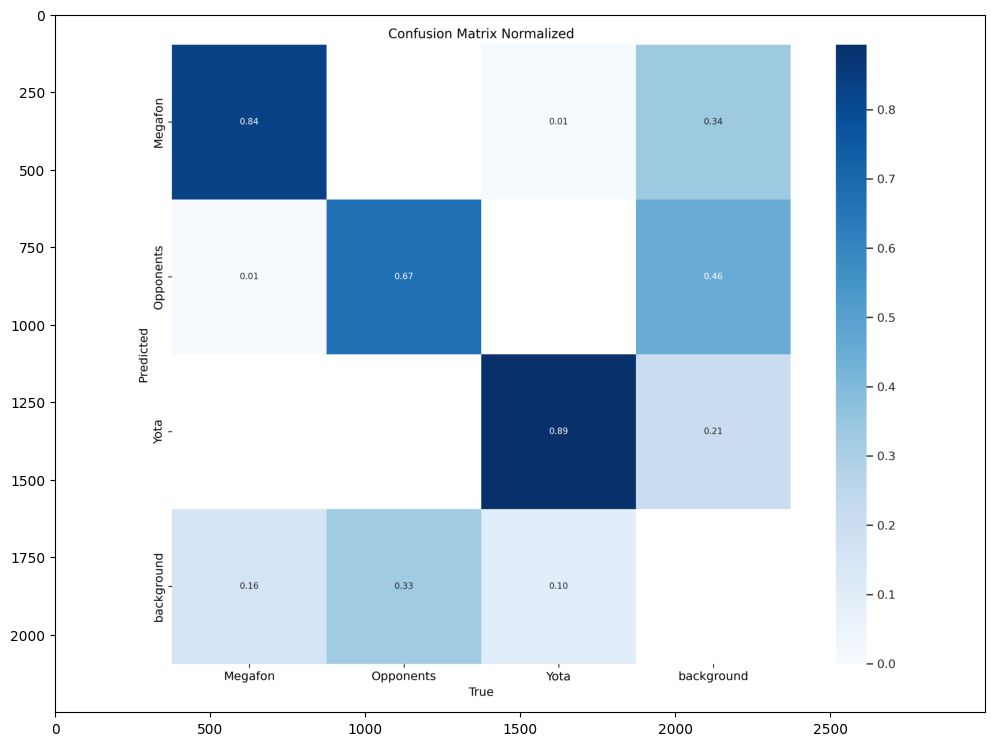

In [26]:
fig, ax = plt.subplots(figsize=(12,10))
plt.imshow(Image.open('/kaggle/working/runs/detect/train/confusion_matrix_normalized.png'))
None

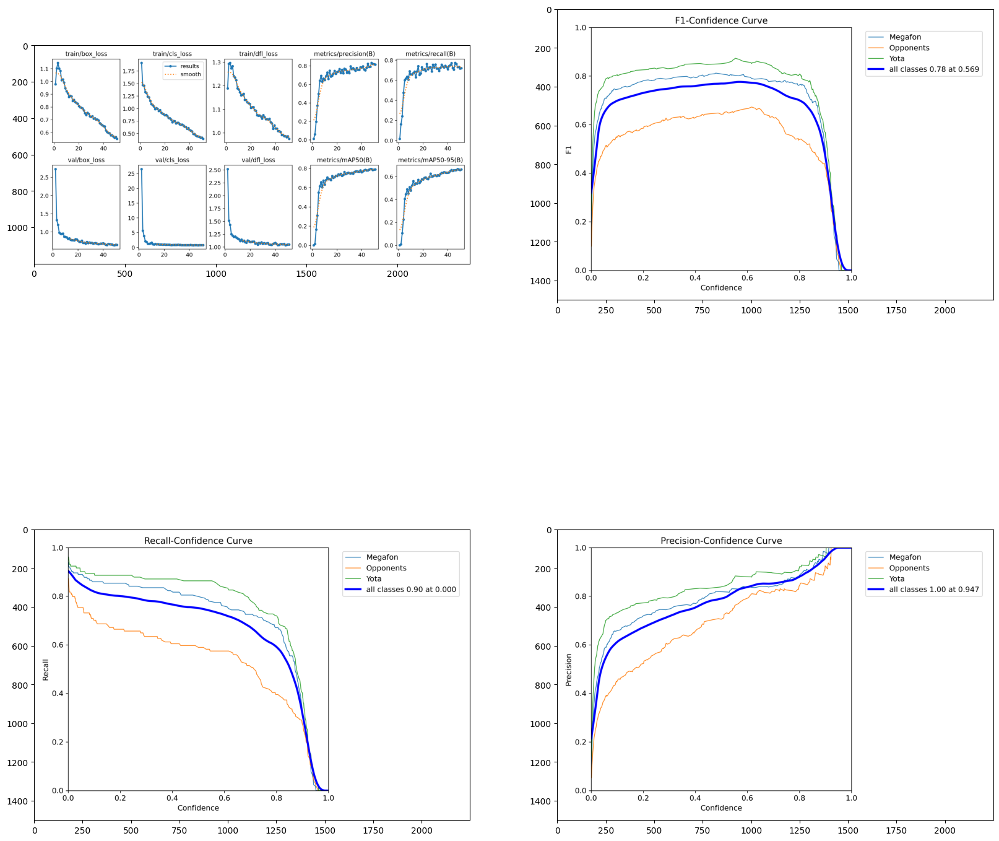

In [54]:
fig, ax = plt.subplots(2, 2, figsize=(20,20))
ax[0][0].imshow(Image.open("/kaggle/working/runs/detect/train/results.png"))
ax[0][1].imshow(Image.open("/kaggle/working/runs/detect/train/F1_curve.png"))
ax[1][0].imshow(Image.open("/kaggle/working/runs/detect/train/R_curve.png"))
ax[1][1].imshow(Image.open("/kaggle/working/runs/detect/train/P_curve.png"))


In [65]:
TEST_DIR = DATA_DIR + "test/images/"

In [37]:
crop_dir_name='/kaggle/working/runs/crops_test'

In [39]:
im0 = cv2.imread('/kaggle/input/posm-data/test/images/942539_1089_jpg.rf.049dc8e9724ec44c92597a5ae52cbc8e.jpg')

In [71]:

res = model.predict('/kaggle/input/posm-data/test/images/942539_1089_jpg.rf.049dc8e9724ec44c92597a5ae52cbc8e.jpg', save=True, retina_masks=True)

Results saved to runs/detect/train4


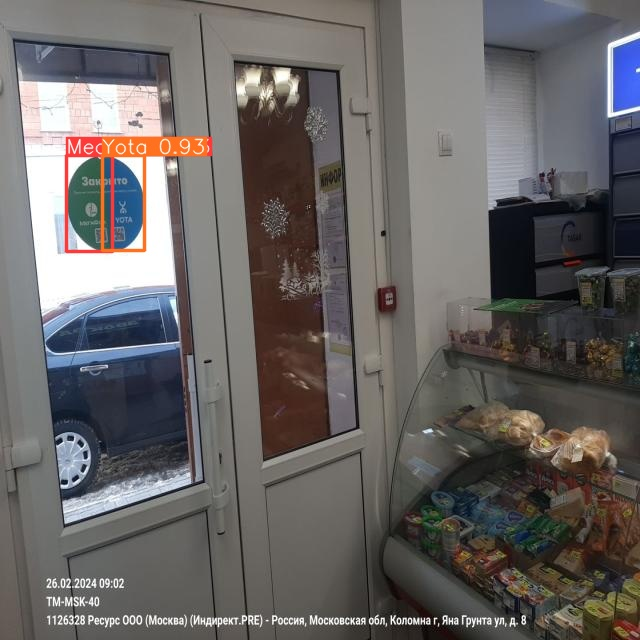

In [72]:
Image.open('/kaggle/working/runs/detect/train4/942539_1089_jpg.rf.049dc8e9724ec44c92597a5ae52cbc8e.jpg')

In [46]:
names = model.names
print(names)

{0: 'Megafon', 1: 'Opponents', 2: 'Yota'}


In [73]:
# results = model.predict(im0, show=False)
boxes = res[0].boxes.xyxy.cpu().tolist()
clss = res[0].boxes.cls.cpu().tolist()
annotator = Annotator(im0, line_width=2, example=names)

In [74]:
os.listdir('/kaggle/working/runs/')
# os.mkdir(crop_dir_name)

['detect', 'crops_test']

LOGGING,  Yota
LOGGING,  Megafon


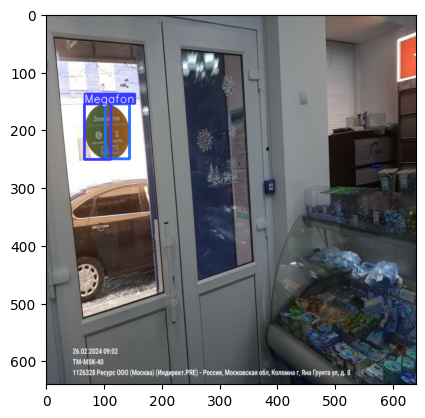

In [75]:
idx=0
if boxes is not None:
    for box, cls in zip(boxes, clss):
        print("LOGGING, " , names[int(cls)])
        annotator.box_label(box, color=colors(int(cls), True), label=names[int(cls)])
        crop_obj = im0[int(box[1]):int(box[3]), int(box[0]):int(box[2])]
        cv2.imwrite(os.path.join(crop_dir_name, names[int(cls)]+".png"), crop_obj)
        idx += 1

    plt.imshow(im0)

In [66]:
os.listdir(crop_dir_name)

['Megafon.png', 'Yota.png', '1.png', '0.png']

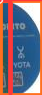

In [69]:
# Image.open(os.path.join(crop_dir_name, '1.png'))
Image.open(os.path.join(crop_dir_name, 'Yota.png'))